# Setup

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.preprocessing import LabelEncoder
import seaborn as sns
import pandas as pd
from sklearn.preprocessing import StandardScaler
import os

In [2]:
# Surpress warnings:
import warnings

def warn(*args, **kwargs):
    pass

warnings.warn = warn

In [3]:
DATA_DIR = "data/"

In [4]:
mcamp_df = pd.read_csv(os.path.join(DATA_DIR, "marketing_campaign.csv"), delimiter = "\t")

In [5]:
mcamp_df

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,...,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,...,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,21-08-2013,26,426,...,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,10-02-2014,26,11,...,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173,...,5,0,0,0,0,0,0,3,11,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,10870,1967,Graduation,Married,61223.0,0,1,13-06-2013,46,709,...,5,0,0,0,0,0,0,3,11,0
2236,4001,1946,PhD,Together,64014.0,2,1,10-06-2014,56,406,...,7,0,0,0,1,0,0,3,11,0
2237,7270,1981,Graduation,Divorced,56981.0,0,0,25-01-2014,91,908,...,6,0,1,0,0,0,0,3,11,0
2238,8235,1956,Master,Together,69245.0,0,1,24-01-2014,8,428,...,3,0,0,0,0,0,0,3,11,0


# EDA (Exploratory Data Analysis)

In [6]:
mcamp_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 29 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   2240 non-null   int64  
 1   Year_Birth           2240 non-null   int64  
 2   Education            2240 non-null   object 
 3   Marital_Status       2240 non-null   object 
 4   Income               2216 non-null   float64
 5   Kidhome              2240 non-null   int64  
 6   Teenhome             2240 non-null   int64  
 7   Dt_Customer          2240 non-null   object 
 8   Recency              2240 non-null   int64  
 9   MntWines             2240 non-null   int64  
 10  MntFruits            2240 non-null   int64  
 11  MntMeatProducts      2240 non-null   int64  
 12  MntFishProducts      2240 non-null   int64  
 13  MntSweetProducts     2240 non-null   int64  
 14  MntGoldProds         2240 non-null   int64  
 15  NumDealsPurchases    2240 non-null   i

In [7]:
mcamp_df.describe()

,ID,Year_Birth,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
count,2240.000000,2240.000000,2216.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,...,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.0,2240.0,2240.000000
mean,5592.159821,1968.805804,52247.251354,0.444196,0.506250,49.109375,303.935714,26.302232,166.950000,37.525446,...,5.316518,0.072768,0.074554,0.072768,0.064286,0.013393,0.009375,3.0,11.0,0.149107
std,3246.662198,11.984069,25173.076661,0.538398,0.544538,28.962453,336.597393,39.773434,225.715373,54.628979,...,2.426645,0.259813,0.262728,0.259813,0.245316,0.114976,0.096391,0.0,0.0,0.356274
min,0.000000,1893.000000,1730.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
25%,2828.250000,1959.000000,35303.000000,0.000000,0.000000,24.000000,23.750000,1.000000,16.000000,3.000000,...,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
50%,5458.500000,1970.000000,51381.500000,0.000000,0.000000,49.000000,173.500000,8.000000,67.000000,12.000000,...,6.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
75%,8427.750000,1977.000000,68522.000000,1.000000,1.000000,74.000000,504.250000,33.000000,232.000000,50.000000,...,7.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
max,11191.000000,1996.000000,666666.000000,2.000000,2.000000,99.000000,1493.000000,199.000000,1725.000000,259.000000,...,20.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,3.0,11.0,1.000000


In [8]:
mcamp_df.describe(include="object")

,Education,Marital_Status,Dt_Customer
count,2240,2240,2240
unique,5,8,663
top,Graduation,Married,31-08-2012
freq,1127,864,12


In [9]:
mcamp_df.isna().sum()

ID                      0
Year_Birth              0
Education               0
Marital_Status          0
Income                 24
Kidhome                 0
Teenhome                0
Dt_Customer             0
Recency                 0
MntWines                0
MntFruits               0
MntMeatProducts         0
MntFishProducts         0
MntSweetProducts        0
MntGoldProds            0
NumDealsPurchases       0
NumWebPurchases         0
NumCatalogPurchases     0
NumStorePurchases       0
NumWebVisitsMonth       0
AcceptedCmp3            0
AcceptedCmp4            0
AcceptedCmp5            0
AcceptedCmp1            0
AcceptedCmp2            0
Complain                0
Z_CostContact           0
Z_Revenue               0
Response                0
dtype: int64

In [10]:
mcamp_df["Education"].unique()

array(['Graduation', 'PhD', 'Master', 'Basic', '2n Cycle'], dtype=object)

In [11]:
mcamp_df.iloc[1,:]

ID                           2174
Year_Birth                   1954
Education              Graduation
Marital_Status             Single
Income                    46344.0
Kidhome                         1
Teenhome                        1
Dt_Customer            08-03-2014
Recency                        38
MntWines                       11
MntFruits                       1
MntMeatProducts                 6
MntFishProducts                 2
MntSweetProducts                1
MntGoldProds                    6
NumDealsPurchases               2
NumWebPurchases                 1
NumCatalogPurchases             1
NumStorePurchases               2
NumWebVisitsMonth               5
AcceptedCmp3                    0
AcceptedCmp4                    0
AcceptedCmp5                    0
AcceptedCmp1                    0
AcceptedCmp2                    0
Complain                        0
Z_CostContact                   3
Z_Revenue                      11
Response                        0
Name: 1, dtype

In [12]:
mcamp_df["Marital_Status"].unique()

array(['Single', 'Together', 'Married', 'Divorced', 'Widow', 'Alone',
       'Absurd', 'YOLO'], dtype=object)

In [13]:
mcamp_df[["Education", "ID"]].groupby("Education").count()

,ID
Education,
2n Cycle,203
Basic,54
Graduation,1127
Master,370
PhD,486


In [14]:
mcamp_df[["Marital_Status","ID"]].groupby("Marital_Status").count()

,ID
Marital_Status,
Absurd,2
Alone,3
Divorced,232
Married,864
Single,480
Together,580
Widow,77
YOLO,2


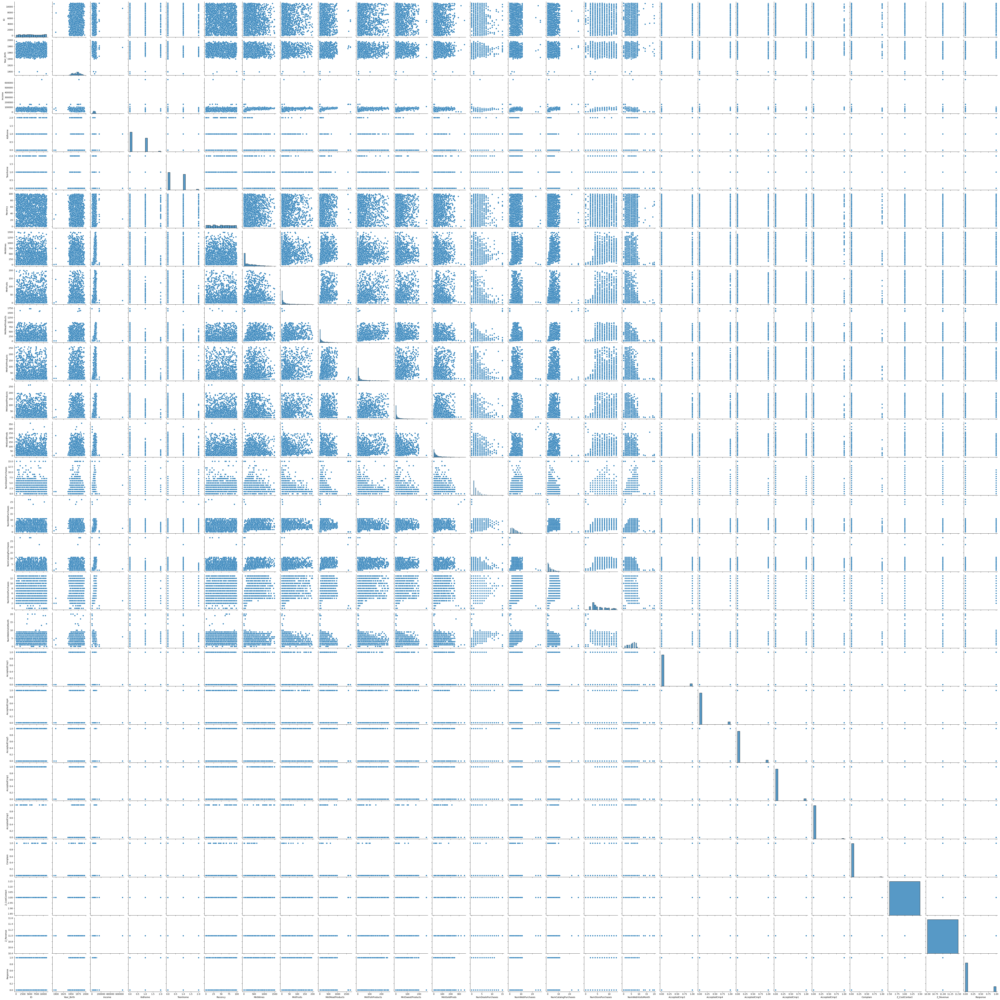

In [15]:
sns.pairplot(mcamp_df)
plt.show()

# Preprocessing

In [16]:
mcamp_df = mcamp_df.dropna()
mcamp_df

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,...,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,...,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,21-08-2013,26,426,...,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,10-02-2014,26,11,...,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173,...,5,0,0,0,0,0,0,3,11,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,10870,1967,Graduation,Married,61223.0,0,1,13-06-2013,46,709,...,5,0,0,0,0,0,0,3,11,0
2236,4001,1946,PhD,Together,64014.0,2,1,10-06-2014,56,406,...,7,0,0,0,1,0,0,3,11,0
2237,7270,1981,Graduation,Divorced,56981.0,0,0,25-01-2014,91,908,...,6,0,1,0,0,0,0,3,11,0
2238,8235,1956,Master,Together,69245.0,0,1,24-01-2014,8,428,...,3,0,0,0,0,0,0,3,11,0


In [17]:
macap_dropable_columns = [
    "ID",
    "Year_Birth",
    "Dt_Customer",
    "Z_CostContact",
    "Z_Revenue",
    "AcceptedCmp1",
    "AcceptedCmp2",
    "AcceptedCmp3",
    "AcceptedCmp4",
    "AcceptedCmp5",
    "Response",
    ]

try:
    mcamp_df = mcamp_df.drop(macap_dropable_columns, axis=1)
except:
    pass

In [18]:
education_encoder = {
    "Basic": 0,
    "2n Cycle": 1,
    "Graduation": 2,
    "Master": 3,
    "PhD": 4
}

marital_encoder = {
    "Absurd": 0,
    "Single": 0,
    "Yolo": 0,
    "Divorced": 1,
    "Widow": 1,
    "Together": 2,
    "Married": 2,
}

mcamp_df["Education"] = mcamp_df["Education"].map(education_encoder)
mcamp_df["Marital_Status"] = mcamp_df["Marital_Status"].map(marital_encoder)
mcamp_df

,Education,Marital_Status,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,Complain
0,2,0.0,58138.0,0,0,58,635,88,546,172,88,88,3,8,10,4,7,0
1,2,0.0,46344.0,1,1,38,11,1,6,2,1,6,2,1,1,2,5,0
2,2,2.0,71613.0,0,0,26,426,49,127,111,21,42,1,8,2,10,4,0
3,2,2.0,26646.0,1,0,26,11,4,20,10,3,5,2,2,0,4,6,0
4,4,2.0,58293.0,1,0,94,173,43,118,46,27,15,5,5,3,6,5,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,2,2.0,61223.0,0,1,46,709,43,182,42,118,247,2,9,3,4,5,0
2236,4,2.0,64014.0,2,1,56,406,0,30,0,0,8,7,8,2,5,7,0
2237,2,1.0,56981.0,0,0,91,908,48,217,32,12,24,1,2,3,13,6,0
2238,3,2.0,69245.0,0,1,8,428,30,214,80,30,61,2,6,5,10,3,0


# Modeling

In [19]:
X = mcamp_df.values[:, :]
X = np.nan_to_num(X)
scaler = StandardScaler()
X = scaler.fit_transform(X)

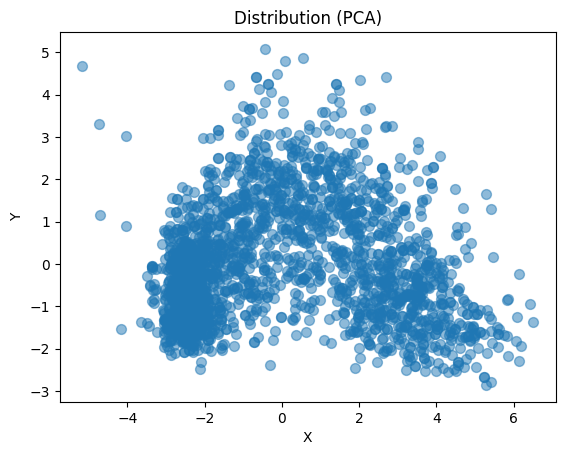

In [20]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)

# Plotting the clusters
plt.scatter(X_pca[:, 0], X_pca[:, 1], s=50, alpha=0.5)

plt.title('Distribution (PCA)')
plt.xlabel('X')
plt.ylabel('Y')
plt.show()

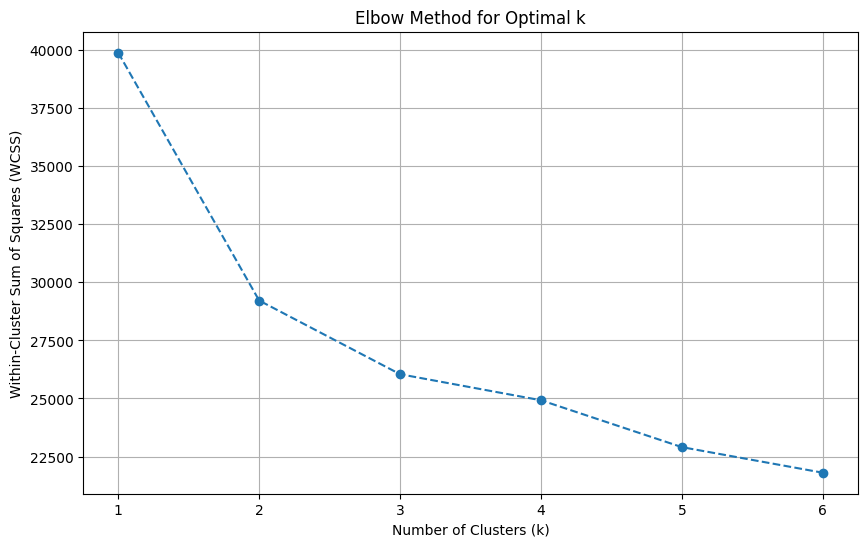

In [21]:
wcss = []
for k in range(1, 7):
    kmeans = KMeans(n_clusters=k, init='k-means++', random_state=123)
    kmeans.fit(X)
    wcss.append(kmeans.inertia_)

# Plot the elbow curve
plt.figure(figsize=(10, 6))
plt.plot(range(1, 7), wcss, marker='o', linestyle='--')
plt.title('Elbow Method for Optimal k')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Within-Cluster Sum of Squares (WCSS)')
plt.xticks(range(1, 7))
plt.grid(True)
plt.show()

In [22]:
clusterNum = 3
k_means = KMeans(init="k-means++", n_clusters=clusterNum, n_init=12)
k_means.fit(X)
labels = k_means.labels_
print(labels)

[1 0 1 ... 2 2 0]


In [23]:
mcamp_df["cluster"] = labels
mcamp_df

,Education,Marital_Status,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,Complain,cluster
0,2,0.0,58138.0,0,0,58,635,88,546,172,88,88,3,8,10,4,7,0,1
1,2,0.0,46344.0,1,1,38,11,1,6,2,1,6,2,1,1,2,5,0,0
2,2,2.0,71613.0,0,0,26,426,49,127,111,21,42,1,8,2,10,4,0,1
3,2,2.0,26646.0,1,0,26,11,4,20,10,3,5,2,2,0,4,6,0,0
4,4,2.0,58293.0,1,0,94,173,43,118,46,27,15,5,5,3,6,5,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,2,2.0,61223.0,0,1,46,709,43,182,42,118,247,2,9,3,4,5,0,2
2236,4,2.0,64014.0,2,1,56,406,0,30,0,0,8,7,8,2,5,7,0,2
2237,2,1.0,56981.0,0,0,91,908,48,217,32,12,24,1,2,3,13,6,0,2
2238,3,2.0,69245.0,0,1,8,428,30,214,80,30,61,2,6,5,10,3,0,2


In [24]:
mcamp_df.groupby('cluster').mean()

,Education,Marital_Status,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,Complain
cluster,,,,,,,,,,,,,,,,,,
0,2.318798,1.414563,34909.409884,0.793605,0.447674,49.276163,41.996124,4.928295,23.139535,7.436047,5.090116,15.341085,2.063953,2.122093,0.544574,3.219961,6.467054,0.012597
1,2.442341,1.361446,76803.762478,0.039587,0.168675,49.380379,589.839931,69.686747,451.717728,100.519793,71.287435,77.065404,1.318417,5.184165,5.984509,8.401033,2.817556,0.006885
2,2.718076,1.533333,58259.389718,0.227197,0.928690,48.207297,481.004975,21.278607,138.864013,28.737977,21.932007,61.061360,3.736318,6.386401,3.117745,7.713101,5.764511,0.006633


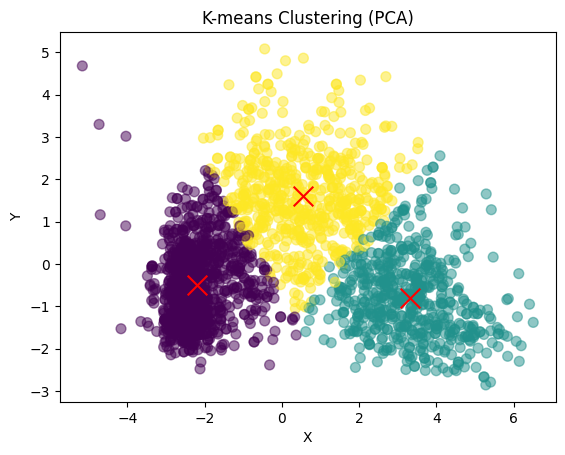

In [25]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)

# Plotting the clusters
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=labels,
            cmap='viridis', s=50, alpha=0.5)

centroids_pca = pca.transform(k_means.cluster_centers_)
plt.scatter(centroids_pca[:, 0], centroids_pca[:, 1],
            c='red', marker='x', s=200)

plt.title('K-means Clustering (PCA)')
plt.xlabel('X')
plt.ylabel('Y')
plt.show()

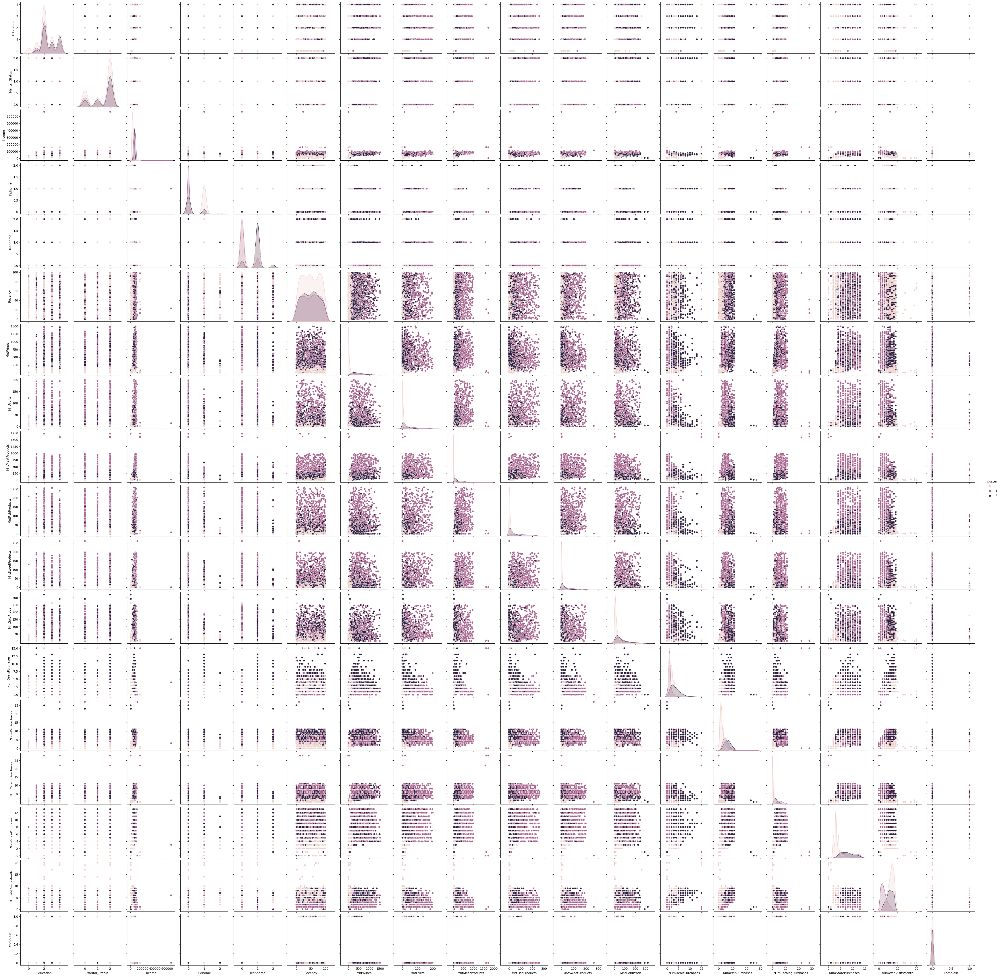

In [26]:
sns.pairplot(mcamp_df, hue="cluster")
plt.show()

In [27]:
mcamp_df.groupby('cluster').count()

,Education,Marital_Status,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,Complain
cluster,,,,,,,,,,,,,,,,,,
0,1032,1030,1032,1032,1032,1032,1032,1032,1032,1032,1032,1032,1032,1032,1032,1032,1032,1032
1,581,581,581,581,581,581,581,581,581,581,581,581,581,581,581,581,581,581
2,603,600,603,603,603,603,603,603,603,603,603,603,603,603,603,603,603,603
